In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import statsmodels.api as sm  
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

%matplotlib inline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def test_stationarity(ts):

    stats = ['Test Statistic','p-value','Lags','Observations']
    df_test = adfuller(ts, autolag='AIC')
    df_results = pd.Series(df_test[0:4], index=stats)

    for key,value in df_test[4].items():
        df_results['Critical Value (%s)'%key] = value
        
    print(df_results)


def forecast_accuracy(forecast, actual):

  mape = np.mean(np.abs(forecast - actual)/np.abs(actual)) # MAPE
  me = np.mean(forecast - actual)                          # ME
  mae = np.mean(np.abs(forecast - actual))                 # MAE
  mpe = np.mean((forecast - actual)/actual)                # MPE
  rmse = np.mean((forecast - actual)**2)**.5               # RMSE
  corr = np.corrcoef(forecast, actual)[0,1]                # corr
  mins = np.amin(np.hstack([forecast[:,None], actual[:,None]]), axis = 1)
  maxs = np.amax(np.hstack([forecast[:,None], actual[:,None]]), axis = 1)
  minmax = 1 - np.mean(mins/maxs)                          # minmax

  return({'MAPE':mape, 'ME':me, 'MAE':mae, 'MPE':mpe, 'RMSE':rmse, 'corr':corr, 'minmax':minmax})


In [ ]:
dataset = "/content/drive/MyDrive/Progetto Data Science/Dataset Nordics Weather/nordics_weather.csv"

# **Analisi delle serie temporali per quanto riguarda le precipitazioni in Finlandia, Svezia e Norvegia**

## **Preprocessing dei dati**

In [ ]:
data = pd.read_csv(dataset, index_col = 1)
data.index = pd.to_datetime(data.index)
data.head()

,country,precipitation,snow_depth,tavg,tmax,tmin
date,,,,,,
2015-01-01,Finland,1.714141,284.545455,1.428571,2.912739,-1.015287
2015-01-02,Finland,10.016667,195.000000,0.553571,2.358599,-0.998718
2015-01-03,Finland,3.956061,284.294118,-1.739286,0.820382,-3.463871
2015-01-04,Finland,0.246193,260.772727,-7.035714,-3.110828,-9.502581
2015-01-05,Finland,0.036364,236.900000,-17.164286,-8.727564,-19.004487


In [ ]:
data_finland = data[data.country == "Finland"]
data_finland.head()

,country,precipitation,snow_depth,tavg,tmax,tmin
date,,,,,,
2015-01-01,Finland,1.714141,284.545455,1.428571,2.912739,-1.015287
2015-01-02,Finland,10.016667,195.000000,0.553571,2.358599,-0.998718
2015-01-03,Finland,3.956061,284.294118,-1.739286,0.820382,-3.463871
2015-01-04,Finland,0.246193,260.772727,-7.035714,-3.110828,-9.502581
2015-01-05,Finland,0.036364,236.900000,-17.164286,-8.727564,-19.004487


In [ ]:
data_sweden = data[data.country == "Sweden"]
data_sweden.head()

,country,precipitation,snow_depth,tavg,tmax,tmin
date,,,,,,
2015-01-01,Sweden,3.642278,84.924623,3.47,5.415354,0.221569
2015-01-02,Sweden,2.414665,67.043702,3.80,5.097244,0.294882
2015-01-03,Sweden,0.212793,79.945946,1.61,2.140392,-1.776680
2015-01-04,Sweden,0.226833,78.997290,-1.35,-0.648425,-5.173123
2015-01-05,Sweden,0.515601,79.736148,-4.27,-3.027451,-9.544488


In [ ]:
data_norway = data[data.country == "Norway"]
data_norway.head()

,country,precipitation,snow_depth,tavg,tmax,tmin
date,,,,,,
2015-01-01,Norway,13.731900,197.985981,3.011111,6.005505,0.769369
2015-01-02,Norway,8.494964,179.415179,1.966667,5.479091,-0.066972
2015-01-03,Norway,4.054317,208.325581,0.042105,2.642202,-1.756481
2015-01-04,Norway,3.025540,233.181818,-2.584211,0.584685,-3.545455
2015-01-05,Norway,2.039928,241.077586,-3.473684,0.182883,-5.254054


## **Finlandia**

### **Analisi esplorativa dei dati**

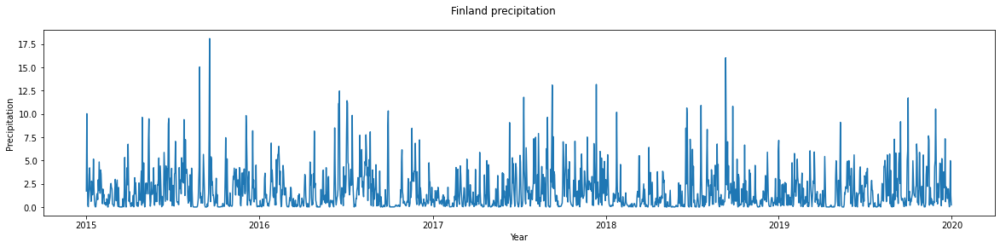

In [ ]:
plt.figure(figsize=(20,4))
plt.suptitle('Finland precipitation')
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_finland.index, data_finland['precipitation'])
plt.show()

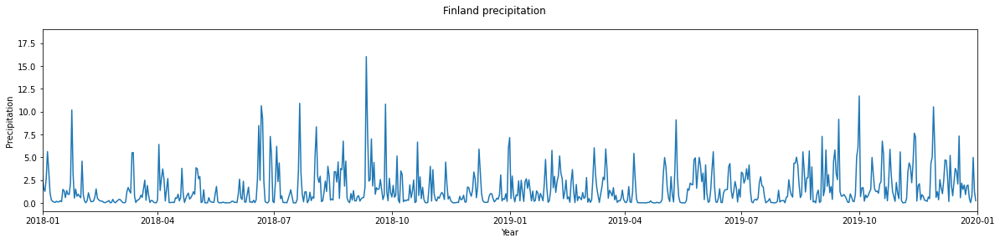

In [ ]:
start = datetime.datetime(2018,1,1)
end = datetime.datetime(2020,1,1)

plt.figure(figsize=(20,4))
plt.suptitle('Finland precipitation')
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_finland['precipitation'])
plt.show()

### **Studio della stazionarietà della serie temporale con relativa stima del parametro D**

In [ ]:
test_stationarity(data_finland['precipitation'])

Test Statistic           -27.657827
p-value                    0.000000
Lags                       0.000000
Observations            1825.000000
Critical Value (1%)       -3.433938
Critical Value (5%)       -2.863125
Critical Value (10%)      -2.567614
dtype: float64


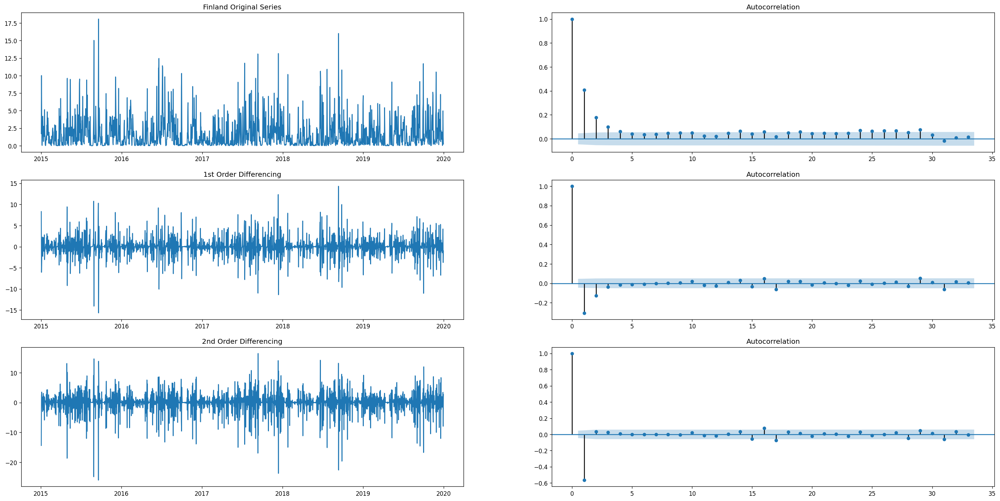

In [ ]:
plt.rcParams.update({'figure.figsize':(30, 15), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex = False)
axes[0, 0].plot(data_finland['precipitation']); axes[0, 0].set_title('Finland Original Series')
plot_acf(data_finland['precipitation'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_finland['precipitation'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_finland['precipitation'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_finland['precipitation'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_finland['precipitation'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

### **Stima dei parametri P e Q**

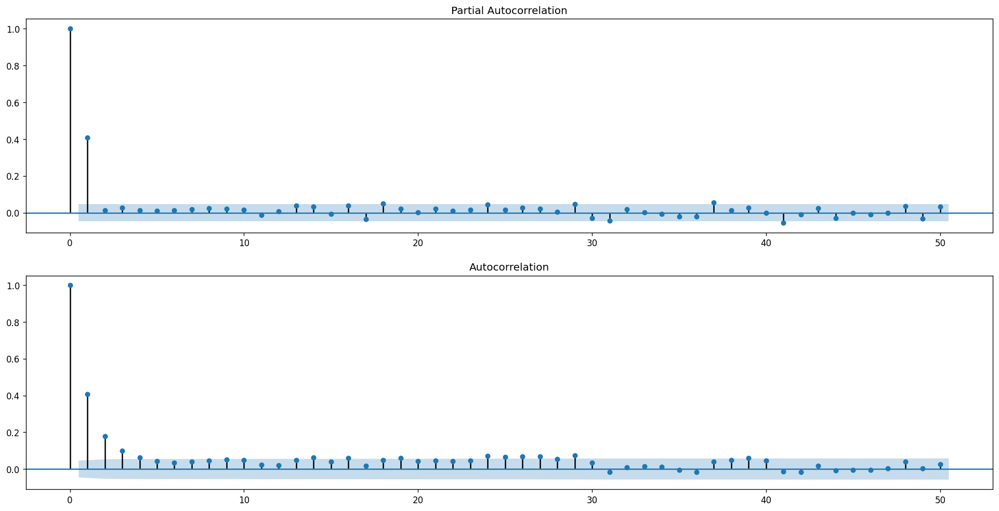

In [ ]:
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(211)
fig = plot_pacf(data_finland['precipitation'], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_acf(data_finland['precipitation'], lags=50, ax=ax2)

### **Fitting del modello ARIMA**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 1)   Log Likelihood               -3812.903
Method:                       css-mle   S.D. of innovations              1.953
Date:                Mon, 08 Aug 2022   AIC                           7633.807
Time:                        13:26:07   BIC                           7655.846
Sample:                    01-01-2015   HQIC                          7641.937
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7097      0.079     21.777      0.000       1.556       1.864
ar.L1.precipitation     0.4409      0.055      8.055      0.000       0.334       0.548
ma.L1.precipitat

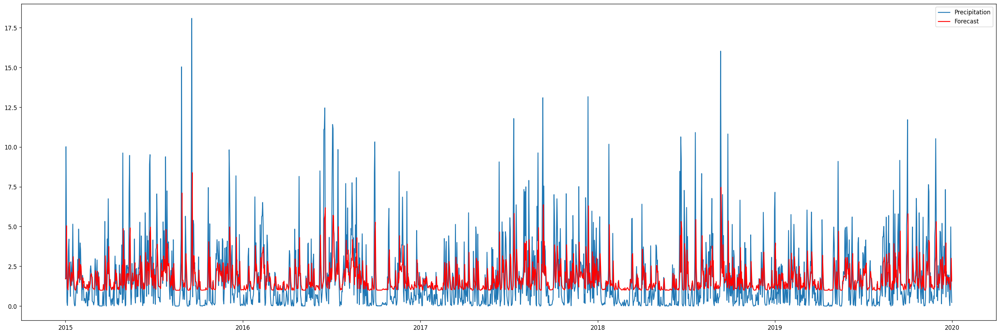

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_finland = ARIMA(data_finland['precipitation'], order=(1, 0, 1))
# Estimate the parameters
results_finland = model_finland.fit()

ax = plt.gca()
plt.plot(data_finland['precipitation'])
plt.plot(results_finland.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_finland.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 0)   Log Likelihood               -3813.103
Method:                       css-mle   S.D. of innovations              1.953
Date:                Mon, 08 Aug 2022   AIC                           7632.206
Time:                        13:26:08   BIC                           7648.735
Sample:                    01-01-2015   HQIC                          7638.303
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7096      0.077     22.137      0.000       1.558       1.861
ar.L1.precipitation     0.4085      0.021     19.130      0.000       0.367       0.450
                

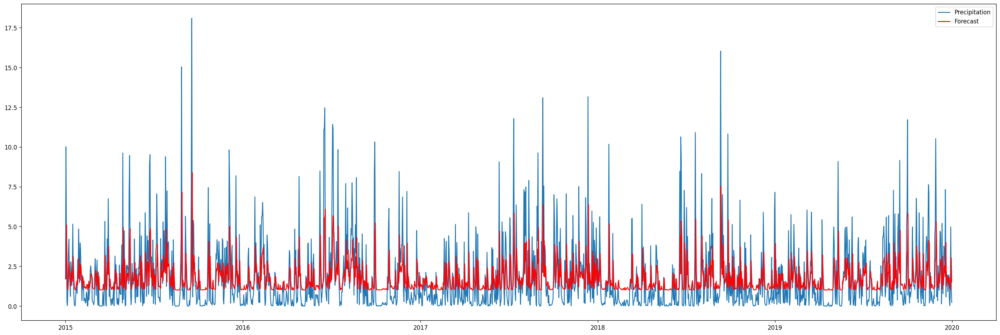

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_finland = ARIMA(data_finland['precipitation'], order=(1, 0, 0))
# Estimate the parameters
results_finland = model_finland.fit()

ax = plt.gca()
plt.plot(data_finland['precipitation'])
plt.plot(results_finland.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_finland.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 3)   Log Likelihood               -3808.885
Method:                       css-mle   S.D. of innovations              1.948
Date:                Mon, 08 Aug 2022   AIC                           7629.770
Time:                        13:26:09   BIC                           7662.829
Sample:                    01-01-2015   HQIC                          7641.964
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7156      0.125     13.717      0.000       1.470       1.961
ar.L1.precipitation     0.9676      0.018     53.066      0.000       0.932       1.003
ma.L1.precipitat

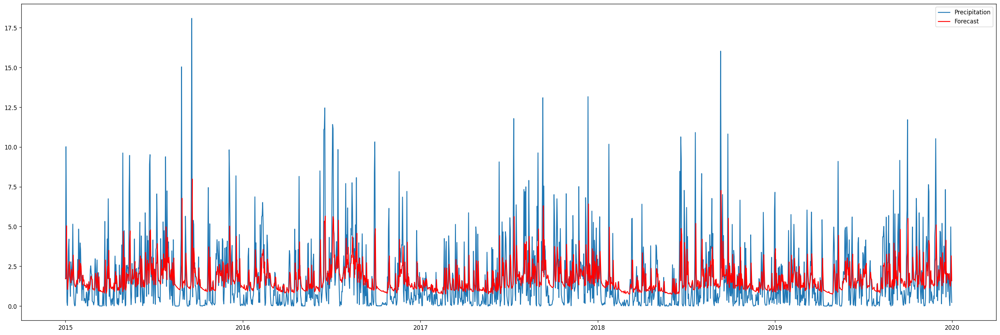

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_finland = ARIMA(data_finland['precipitation'], order=(1, 0, 3))
# Estimate the parameters
results_finland = model_finland.fit()

ax = plt.gca()
plt.plot(data_finland['precipitation'])
plt.plot(results_finland.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_finland.summary()) 

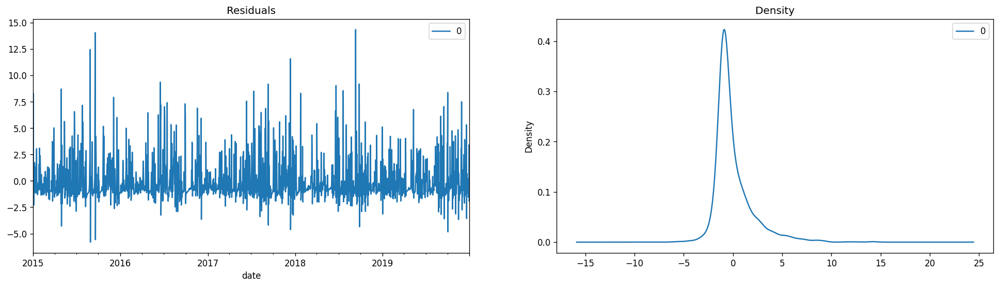

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_finland.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (ARIMA)**

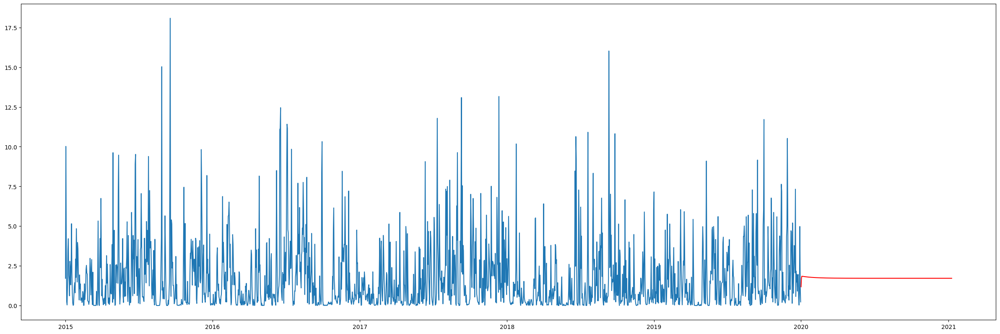

In [ ]:
plt.figure(figsize = (30,10), dpi = 100)
num_points_finland = len(data_finland['precipitation'])
x_finland = results_finland.predict(start = (num_points_finland), end = (num_points_finland + 374), dynamic=False)

plt.plot(data_finland['precipitation'][:num_points_finland])
plt.plot(x_finland, color='r')

### **Out-of-time Cross Validation (ARIMA)**

In [ ]:
train_part = int(num_points_finland * 0.85)
test_part = num_points_finland - train_part

train = data_finland['precipitation'][:train_part]
test = data_finland['precipitation'][train_part:]

# Construct the model
new_model_finland = ARIMA(train, order=(1, 0, 3))
# Estimate the parameters
new_results_finland = new_model_finland.fit()

print(new_results_finland.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1552
Model:                     ARMA(1, 3)   Log Likelihood               -3244.279
Method:                       css-mle   S.D. of innovations              1.957
Date:                Mon, 08 Aug 2022   AIC                           6500.558
Time:                        15:08:28   BIC                           6532.642
Sample:                    01-01-2015   HQIC                          6512.490
                         - 04-01-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.6876      0.139     12.138      0.000       1.415       1.960
ar.L1.precipitation     0.9661      0.020     47.809      0.000       0.926       1.006
ma.L1.precipitat

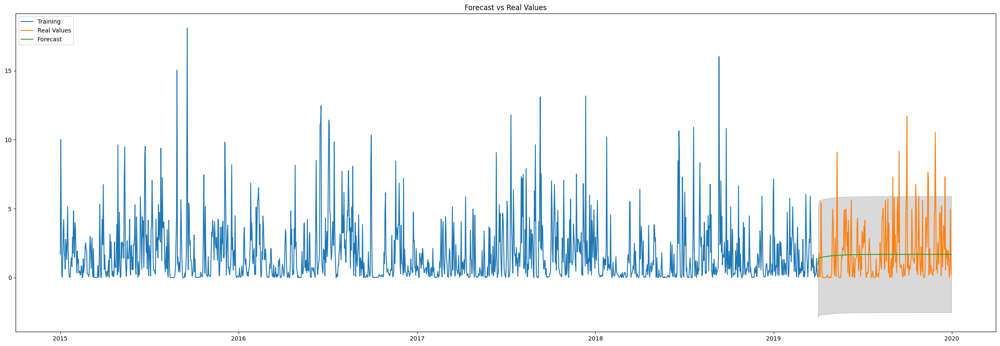

In [ ]:
# Construct the forecasts

# Forecast
fc, se, conf = new_results_finland.forecast(test_part, alpha = 0.05)

# Make as pandas series
fc_series = pd.Series(fc, index = test.index)
lower_series = pd.Series(conf[:, 0], index = test.index)
upper_series = pd.Series(conf[:, 1], index = test.index)

# Plot
plt.figure(figsize = (30,10), dpi = 100)
plt.plot(train, label = "Training")
plt.plot(test, label = "Real Values")
plt.plot(fc_series, label = "Forecast")
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha = .15)
plt.title("Forecast vs Real Values")
plt.legend(loc = 'upper left', fontsize = 10)
plt.show()

In [ ]:
# Accuracy metrics

forecast_accuracy(fc, test.values)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


{'MAE': 1.5338339583493463,
 'MAPE': inf,
 'ME': -0.17757667497042592,
 'MPE': inf,
 'RMSE': 2.060520916743298,
 'corr': 0.17286263924082995,
 'minmax': 0.596198246739743}

### **Fitting del modello SARIMAX**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -3812.903
Date:                Mon, 08 Aug 2022   AIC                           7633.807
Time:                        14:16:08   BIC                           7655.846
Sample:                    01-01-2015   HQIC                          7641.937
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.9557      0.114      8.386      0.000       0.732       1.179
ar.L1          0.4410      0.047      9.460      0.000       0.350       0.532
ma.L1         -0.0390      0.050     -0.774      0.4

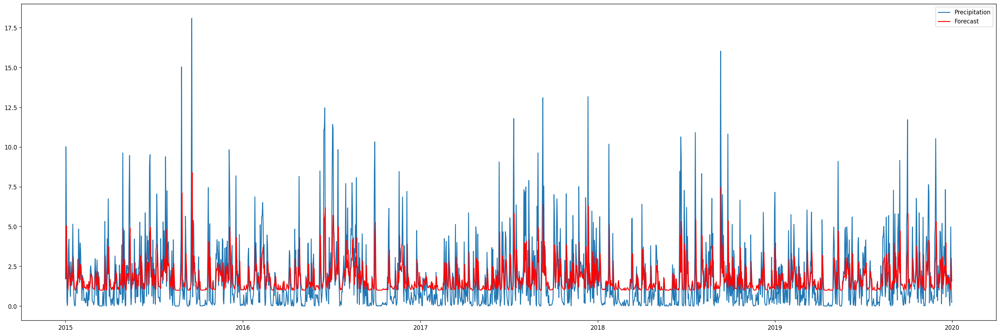

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_finland = sm.tsa.SARIMAX(data_finland['precipitation'], order=(1, 0, 1, 12), trend='c')
# Estimate the parameters
results_finland = model_finland.fit()

ax = plt.gca()
plt.plot(data_finland['precipitation'])
plt.plot(results_finland.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_finland.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 0)   Log Likelihood               -3813.103
Date:                Mon, 08 Aug 2022   AIC                           7632.206
Time:                        14:19:42   BIC                           7648.735
Sample:                    01-01-2015   HQIC                          7638.303
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0110      0.082     12.343      0.000       0.850       1.172
ar.L1          0.4085      0.015     27.633      0.000       0.380       0.438
sigma2         3.8131      0.081     46.869      0.0

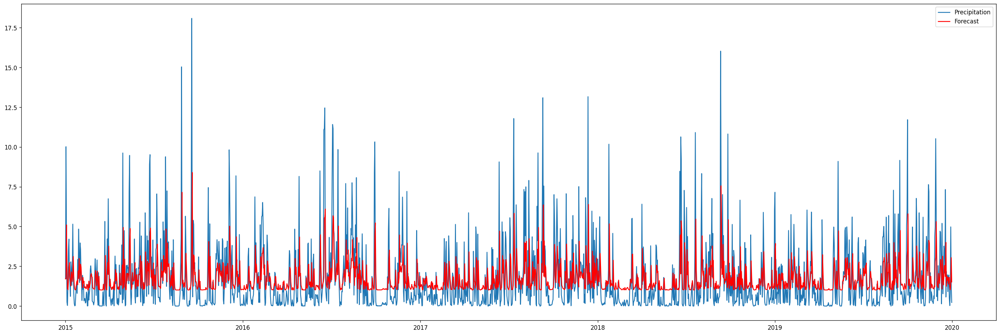

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_finland = sm.tsa.SARIMAX(data_finland['precipitation'], order=(1, 0, 0, 12), trend='c')
# Estimate the parameters
results_finland = model_finland.fit()

ax = plt.gca()
plt.plot(data_finland['precipitation'])
plt.plot(results_finland.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_finland.summary()) 

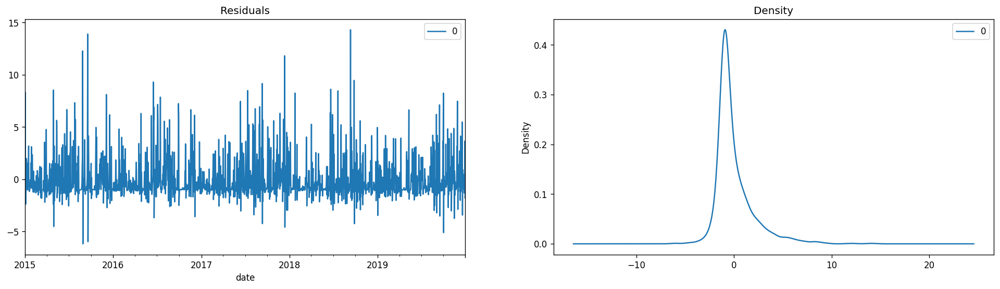

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_finland.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (SARIMAX)**

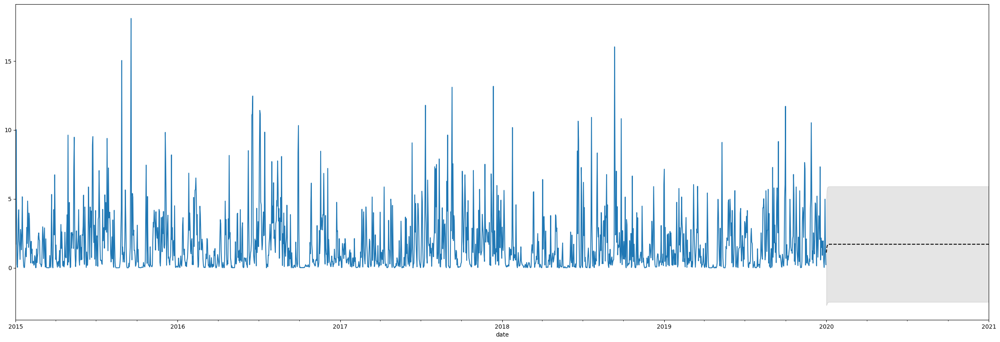

In [ ]:
fig, ax = plt.subplots(figsize = (30,10), dpi = 100)

# Plot the data (here we are subsetting it to get a better look at the forecasts)
data_finland['precipitation'].loc['2015':].plot(ax=ax)

# Construct the forecasts
fcast = results_finland.get_forecast('2021').summary_frame()
fcast['mean'].plot(ax=ax, style='k--')
ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='k', alpha=0.1);

## **Svezia**

### **Analisi esplorativa dei dati**

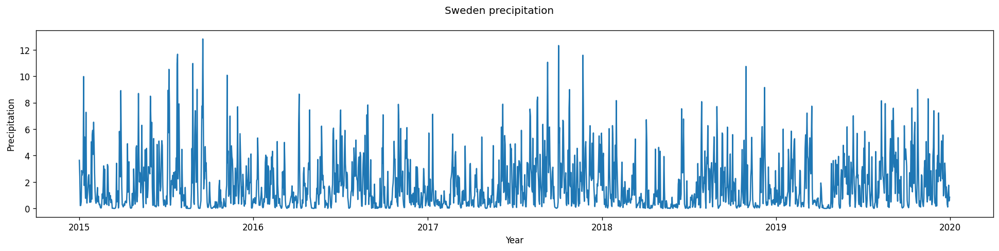

In [ ]:
plt.figure(figsize=(20,4))
plt.suptitle('Sweden precipitation')
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_sweden.index, data_sweden['precipitation'])
plt.show()

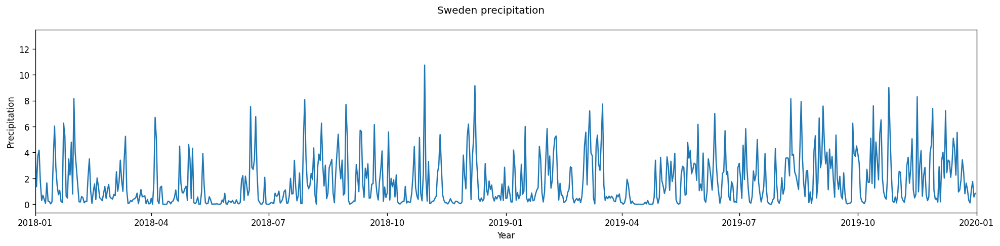

In [ ]:
start = datetime.datetime(2018,1,1)
end = datetime.datetime(2020,1,1)

plt.figure(figsize=(20,4))
plt.suptitle('Sweden precipitation')
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_sweden['precipitation'])
plt.show()

### **Studio della stazionarietà della serie temporale con relativa stima del parametro D**

In [ ]:
test_stationarity(data_sweden['precipitation'])

Test Statistic         -1.631825e+01
p-value                 3.146373e-29
Lags                    3.000000e+00
Observations            1.822000e+03
Critical Value (1%)    -3.433944e+00
Critical Value (5%)    -2.863128e+00
Critical Value (10%)   -2.567615e+00
dtype: float64


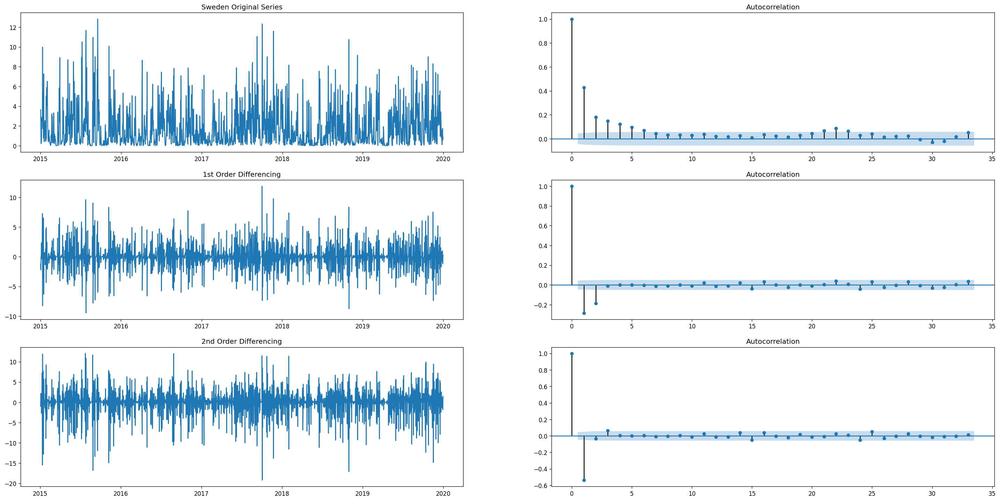

In [ ]:
plt.rcParams.update({'figure.figsize':(30, 15), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex = False)
axes[0, 0].plot(data_sweden['precipitation']); axes[0, 0].set_title('Sweden Original Series')
plot_acf(data_sweden['precipitation'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_sweden['precipitation'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_sweden['precipitation'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_sweden['precipitation'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_sweden['precipitation'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

### **Stima dei parametri P e Q**

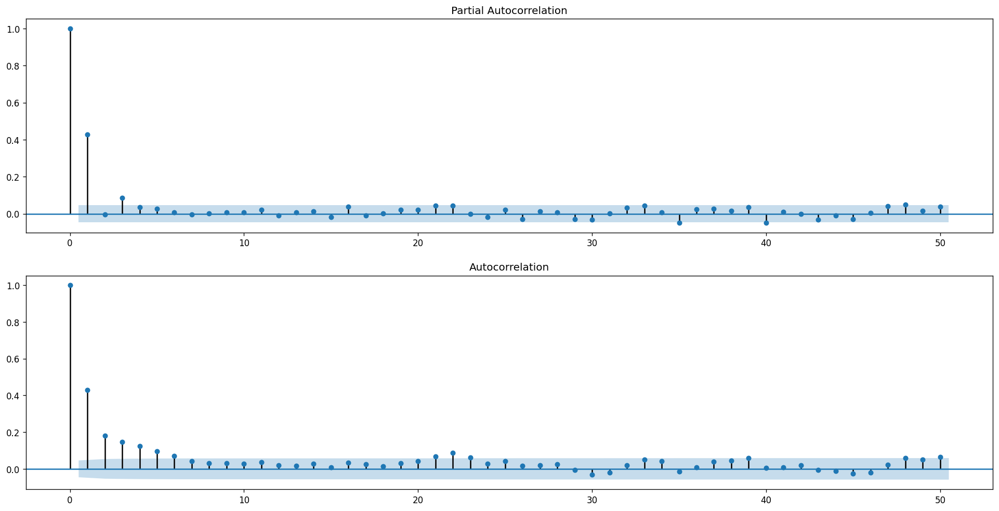

In [ ]:
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(211)
fig = plot_pacf(data_sweden['precipitation'], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_acf(data_sweden['precipitation'], lags=50, ax=ax2)

### **Fitting del modello ARIMA**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 1)   Log Likelihood               -3670.609
Method:                       css-mle   S.D. of innovations              1.806
Date:                Mon, 08 Aug 2022   AIC                           7349.217
Time:                        13:26:16   BIC                           7371.257
Sample:                    01-01-2015   HQIC                          7357.347
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7852      0.073     24.291      0.000       1.641       1.929
ar.L1.precipitation     0.4169      0.062      6.769      0.000       0.296       0.538
ma.L1.precipitat

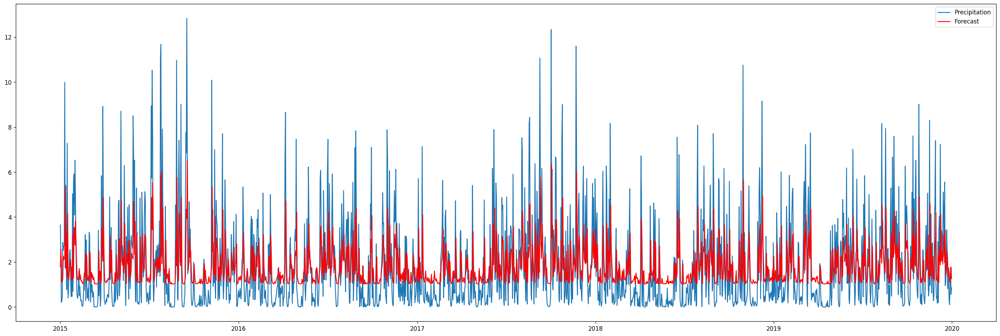

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_sweden = ARIMA(data_sweden['precipitation'], order=(1, 0, 1))
# Estimate the parameters
results_sweden = model_sweden.fit()

ax = plt.gca()
plt.plot(data_sweden['precipitation'])
plt.plot(results_sweden.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_sweden.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 2)   Log Likelihood               -3661.842
Method:                       css-mle   S.D. of innovations              1.797
Date:                Mon, 08 Aug 2022   AIC                           7333.684
Time:                        13:26:18   BIC                           7361.234
Sample:                    01-01-2015   HQIC                          7343.847
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7848      0.089     19.996      0.000       1.610       1.960
ar.L1.precipitation     0.7968      0.059     13.601      0.000       0.682       0.912
ma.L1.precipitat

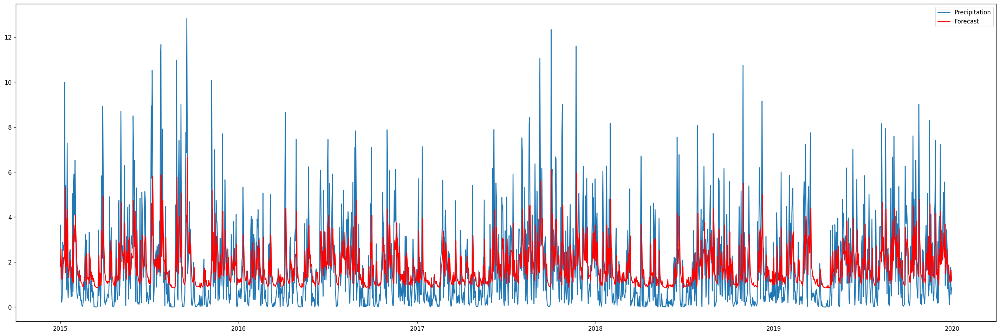

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_sweden = ARIMA(data_sweden['precipitation'], order=(1, 0, 2))
# Estimate the parameters
results_sweden = model_sweden.fit()

ax = plt.gca()
plt.plot(data_sweden['precipitation'])
plt.plot(results_sweden.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_sweden.summary()) 

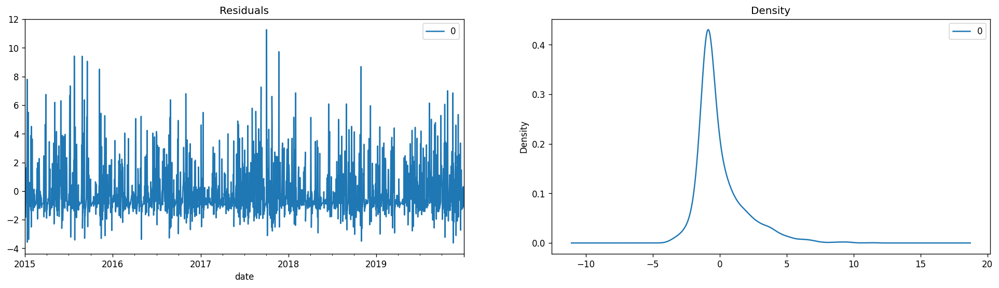

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_sweden.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (ARIMA)**

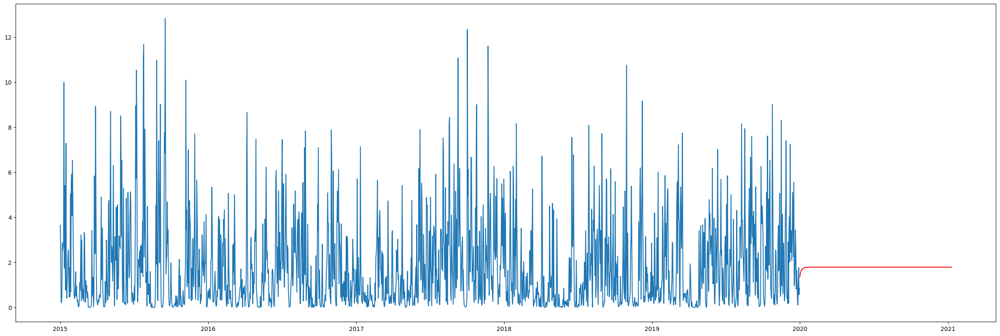

In [ ]:
plt.figure(figsize = (30,10), dpi = 100)
num_points_sweden = len(data_sweden['precipitation'])
x_sweden = results_sweden.predict(start = (num_points_sweden), end = (num_points_sweden + 374), dynamic=False)

plt.plot(data_sweden['precipitation'][:num_points_sweden])
plt.plot(x_sweden, color='r')

### **Out-of-time Cross Validation (ARIMA)**

In [ ]:
train_part = int(num_points_sweden * 0.85)
test_part = num_points_sweden - train_part

train = data_sweden['precipitation'][:train_part]
test = data_sweden['precipitation'][train_part:]

# Construct the model
new_model_sweden = ARIMA(train, order=(1, 0, 2))
# Estimate the parameters
new_results_sweden = new_model_sweden.fit()

print(new_results_sweden.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1552
Model:                     ARMA(1, 2)   Log Likelihood               -3108.271
Method:                       css-mle   S.D. of innovations              1.793
Date:                Mon, 08 Aug 2022   AIC                           6226.542
Time:                        15:14:28   BIC                           6253.278
Sample:                    01-01-2015   HQIC                          6236.485
                         - 04-01-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.7369      0.096     18.006      0.000       1.548       1.926
ar.L1.precipitation     0.7853      0.062     12.598      0.000       0.663       0.907
ma.L1.precipitat

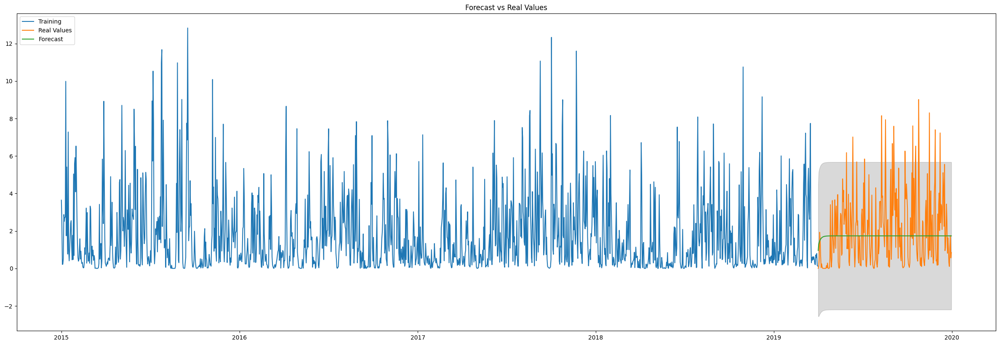

In [ ]:
# Construct the forecasts

# Forecast
fc, se, conf = new_results_sweden.forecast(test_part, alpha = 0.05)

# Make as pandas series
fc_series = pd.Series(fc, index = test.index)
lower_series = pd.Series(conf[:, 0], index = test.index)
upper_series = pd.Series(conf[:, 1], index = test.index)

# Plot
plt.figure(figsize = (30,10), dpi = 100)
plt.plot(train, label = "Training")
plt.plot(test, label = "Real Values")
plt.plot(fc_series, label = "Forecast")
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha = .15)
plt.title("Forecast vs Real Values")
plt.legend(loc = 'upper left', fontsize = 10)
plt.show()

In [ ]:
# Accuracy metrics

forecast_accuracy(fc, test.values)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


{'MAE': 1.5088599318660445,
 'MAPE': inf,
 'ME': -0.32537044236860807,
 'MPE': inf,
 'RMSE': 1.9458102982740655,
 'corr': 0.1381226386487599,
 'minmax': 0.5574769414106677}

### **Fitting del modello SARIMAX**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -3670.609
Date:                Mon, 08 Aug 2022   AIC                           7349.217
Time:                        14:27:48   BIC                           7371.257
Sample:                    01-01-2015   HQIC                          7357.347
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0408      0.111      9.337      0.000       0.822       1.259
ar.L1          0.4170      0.045      9.273      0.000       0.329       0.505
ma.L1          0.0142      0.048      0.298      0.7

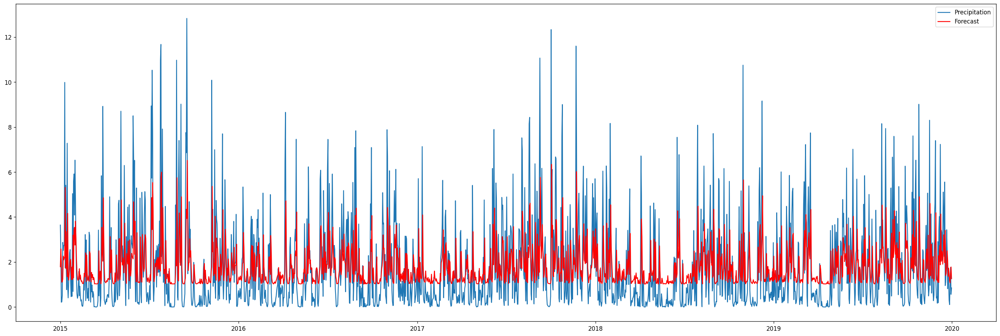

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_sweden = sm.tsa.SARIMAX(data_sweden['precipitation'], order=(1, 0, 1, 12), trend='c')
# Estimate the parameters
results_sweden = model_sweden.fit()

ax = plt.gca()
plt.plot(data_sweden['precipitation'])
plt.plot(results_sweden.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_sweden.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 2)   Log Likelihood               -3661.842
Date:                Mon, 08 Aug 2022   AIC                           7333.684
Time:                        14:29:31   BIC                           7361.234
Sample:                    01-01-2015   HQIC                          7343.847
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3627      0.112      3.225      0.001       0.142       0.583
ar.L1          0.7968      0.059     13.602      0.000       0.682       0.912
ma.L1         -0.3703      0.064     -5.816      0.0

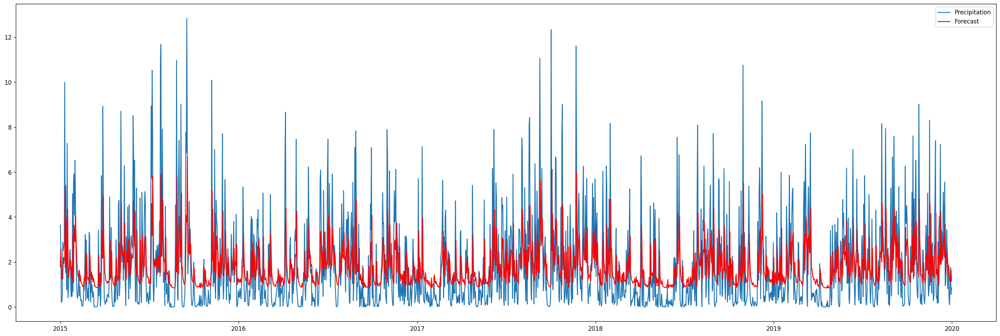

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_sweden = sm.tsa.SARIMAX(data_sweden['precipitation'], order=(1, 0, 2, 12), trend='c')
# Estimate the parameters
results_sweden = model_sweden.fit()

ax = plt.gca()
plt.plot(data_sweden['precipitation'])
plt.plot(results_sweden.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_sweden.summary()) 

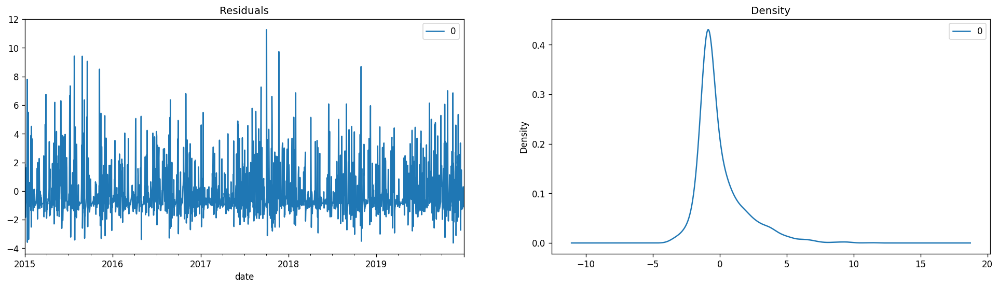

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_sweden.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (SARIMAX)**

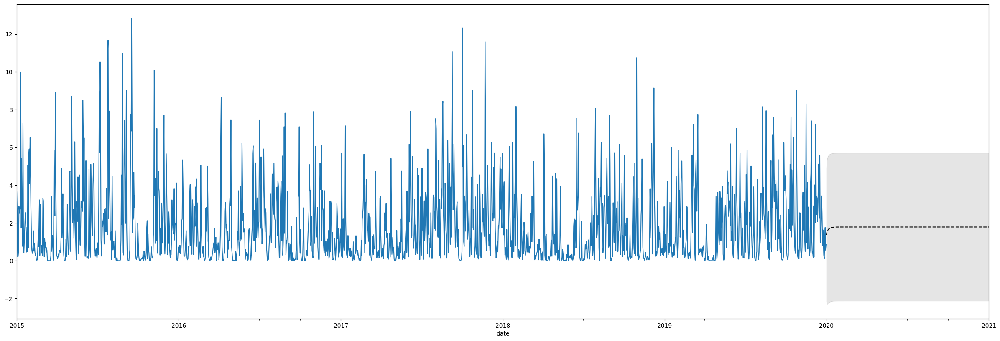

In [ ]:
fig, ax = plt.subplots(figsize = (30,10), dpi = 100)

# Plot the data (here we are subsetting it to get a better look at the forecasts)
data_sweden['precipitation'].loc['2015':].plot(ax=ax)

# Construct the forecasts
fcast = results_sweden.get_forecast('2021').summary_frame()
fcast['mean'].plot(ax=ax, style='k--')
ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='k', alpha=0.1);

## **Norvegia**

### **Analisi esplorativa dei dati**

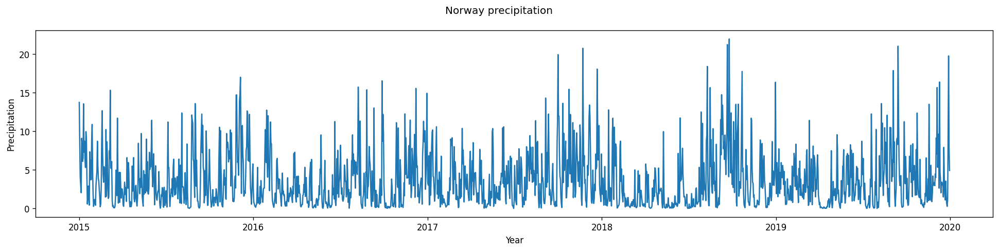

In [ ]:
plt.figure(figsize=(20,4))
plt.suptitle('Norway precipitation')
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_norway.index, data_norway['precipitation'])
plt.show()

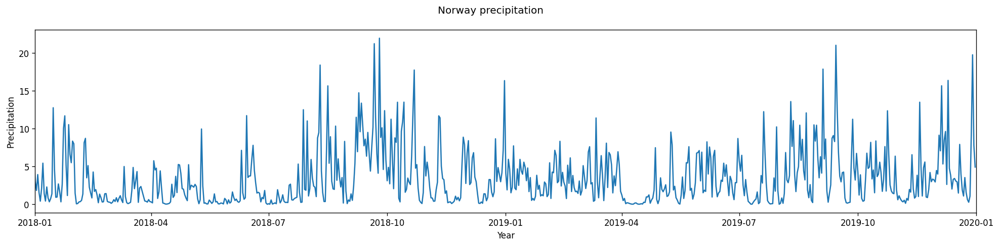

In [ ]:
start = datetime.datetime(2018,1,1)
end = datetime.datetime(2020,1,1)

plt.figure(figsize=(20,4))
plt.suptitle('Norway precipitation')
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Year')
ax.set_ylabel('Precipitation')
plt.plot(data_norway['precipitation'])
plt.show()

### **Studio della stazionarietà della serie temporale con relativa stima del parametro D**

In [ ]:
test_stationarity(data_norway['precipitation'])

Test Statistic         -1.531320e+01
p-value                 4.159407e-28
Lags                    3.000000e+00
Observations            1.822000e+03
Critical Value (1%)    -3.433944e+00
Critical Value (5%)    -2.863128e+00
Critical Value (10%)   -2.567615e+00
dtype: float64


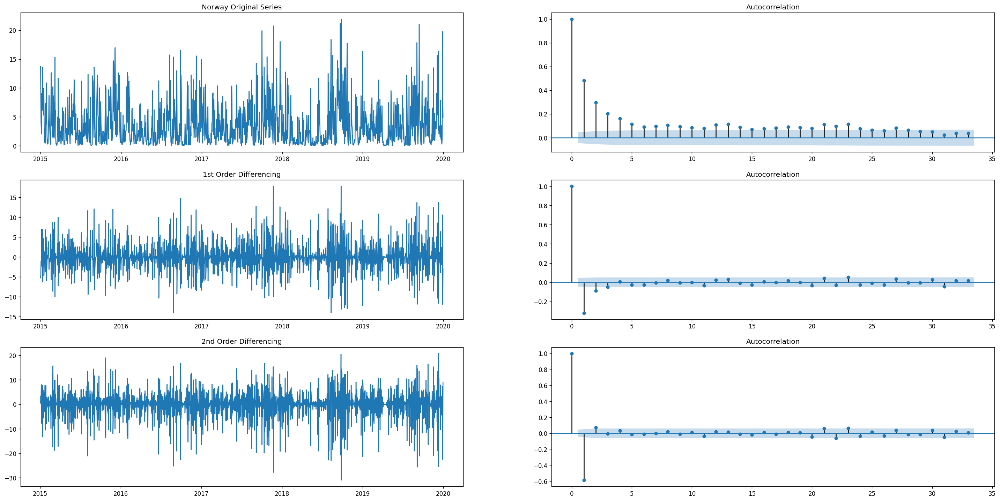

In [ ]:
plt.rcParams.update({'figure.figsize':(30, 15), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex = False)
axes[0, 0].plot(data_norway['precipitation']); axes[0, 0].set_title('Norway Original Series')
plot_acf(data_norway['precipitation'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_norway['precipitation'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_norway['precipitation'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_norway['precipitation'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_norway['precipitation'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

### **Stima dei parametri P e Q**

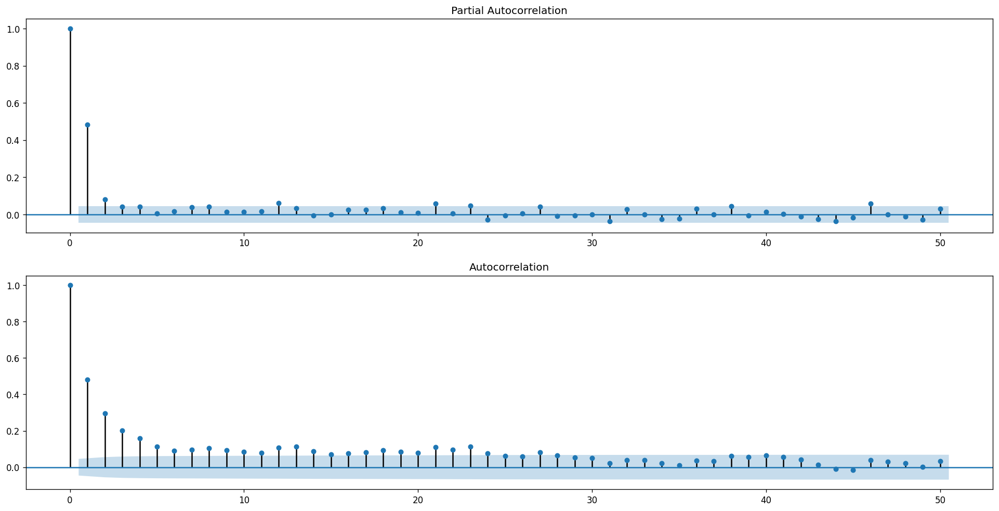

In [ ]:
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(211)
fig = plot_pacf(data_norway['precipitation'], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_acf(data_norway['precipitation'], lags=50, ax=ax2)

### **Fitting del modello ARIMA**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 2)   Log Likelihood               -4644.723
Method:                       css-mle   S.D. of innovations              3.079
Date:                Mon, 08 Aug 2022   AIC                           9299.446
Time:                        13:26:24   BIC                           9326.996
Sample:                    01-01-2015   HQIC                          9309.608
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   3.6380      0.171     21.320      0.000       3.304       3.972
ar.L1.precipitation     0.7413      0.059     12.498      0.000       0.625       0.858
ma.L1.precipitat

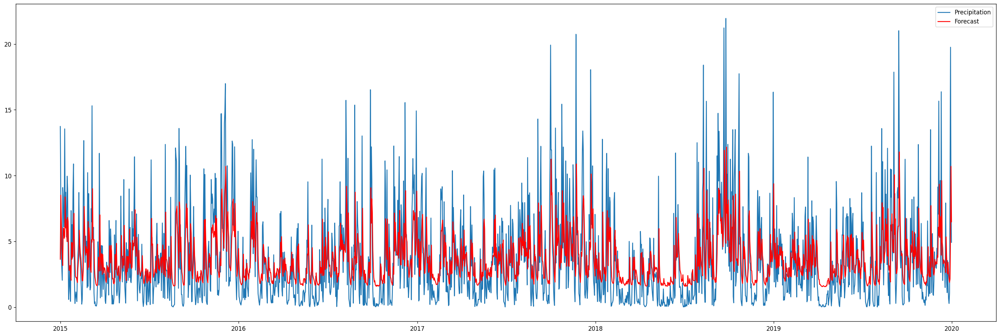

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_norway = ARIMA(data_norway['precipitation'], order=(1, 0, 2))
# Estimate the parameters
results_norway = model_norway.fit()

ax = plt.gca()
plt.plot(data_norway['precipitation'])
plt.plot(results_norway.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_norway.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1826
Model:                     ARMA(1, 3)   Log Likelihood               -4640.840
Method:                       css-mle   S.D. of innovations              3.072
Date:                Mon, 08 Aug 2022   AIC                           9293.680
Time:                        13:26:26   BIC                           9326.739
Sample:                    01-01-2015   HQIC                          9305.875
                         - 12-31-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   3.6625      0.249     14.723      0.000       3.175       4.150
ar.L1.precipitation     0.9492      0.026     36.271      0.000       0.898       1.000
ma.L1.precipitat

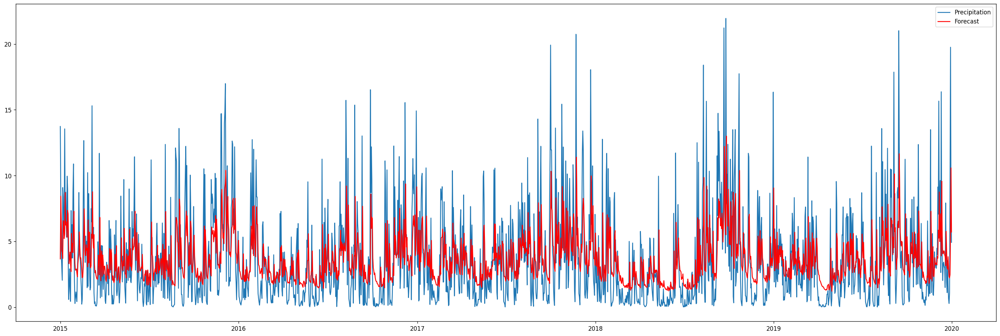

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_norway = ARIMA(data_norway['precipitation'], order=(1, 0, 3))
# Estimate the parameters
results_norway = model_norway.fit()

ax = plt.gca()
plt.plot(data_norway['precipitation'])
plt.plot(results_norway.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_norway.summary()) 

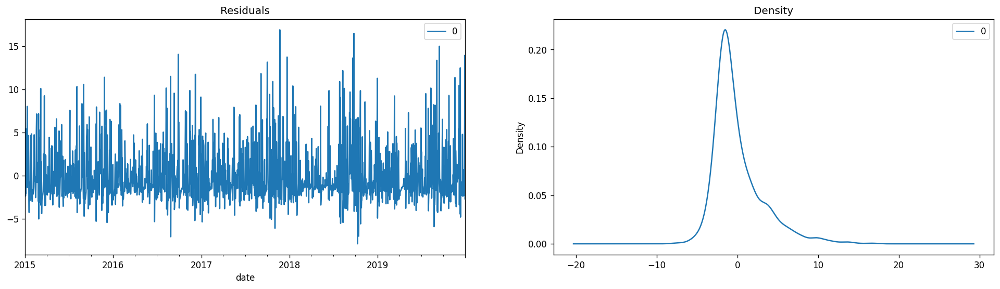

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_norway.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (ARIMA)**

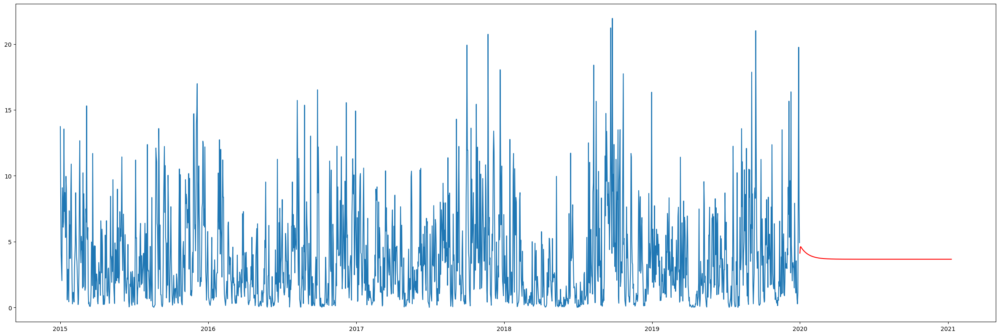

In [ ]:
plt.figure(figsize = (30,10), dpi = 100)
num_points_norway = len(data_norway['precipitation'])
x_norway = results_norway.predict(start = (num_points_norway), end = (num_points_norway + 374), dynamic=False)

plt.plot(data_norway['precipitation'][:num_points_norway])
plt.plot(x_norway, color='r')

### **Out-of-time Cross Validation (ARIMA)**

In [ ]:
train_part = int(num_points_norway * 0.85)
test_part = num_points_norway - train_part

train = data_norway['precipitation'][:train_part]
test = data_norway['precipitation'][train_part:]

# Construct the model
new_model_norway = ARIMA(train, order=(1, 0, 3))
# Estimate the parameters
new_results_norway = new_model_norway.fit()

print(new_results_norway.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:          precipitation   No. Observations:                 1552
Model:                     ARMA(1, 3)   Log Likelihood               -3922.282
Method:                       css-mle   S.D. of innovations              3.029
Date:                Mon, 08 Aug 2022   AIC                           7856.565
Time:                        15:13:46   BIC                           7888.649
Sample:                    01-01-2015   HQIC                          7868.497
                         - 04-01-2019                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   3.6597      0.275     13.314      0.000       3.121       4.198
ar.L1.precipitation     0.9507      0.030     32.087      0.000       0.893       1.009
ma.L1.precipitat

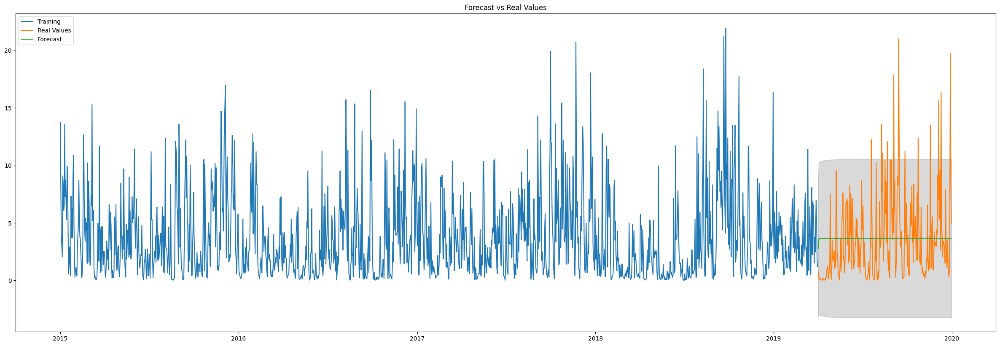

In [ ]:
# Construct the forecasts

# Forecast
fc, se, conf = new_results_norway.forecast(test_part, alpha = 0.05)

# Make as pandas series
fc_series = pd.Series(fc, index = test.index)
lower_series = pd.Series(conf[:, 0], index = test.index)
upper_series = pd.Series(conf[:, 1], index = test.index)

# Plot
plt.figure(figsize = (30,10), dpi = 100)
plt.plot(train, label = "Training")
plt.plot(test, label = "Real Values")
plt.plot(fc_series, label = "Forecast")
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha = .15)
plt.title("Forecast vs Real Values")
plt.legend(loc = 'upper left', fontsize = 10)
plt.show()

In [ ]:
# Accuracy metrics

forecast_accuracy(fc, test.values)

{'MAE': 2.7842472446083715,
 'MAPE': 9.257864955601955,
 'ME': 0.04694052137790342,
 'MPE': 8.953420122371835,
 'RMSE': 3.671534221620007,
 'corr': 0.07048104282093721,
 'minmax': 0.540093093215549}

### **Fitting del modello SARIMAX**

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 2)   Log Likelihood               -4644.723
Date:                Mon, 08 Aug 2022   AIC                           9299.446
Time:                        14:35:55   BIC                           9326.996
Sample:                    01-01-2015   HQIC                          9309.608
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.9404      0.174      5.399      0.000       0.599       1.282
ar.L1          0.7415      0.043     17.330      0.000       0.658       0.825
ma.L1         -0.3063      0.046     -6.655      0.0

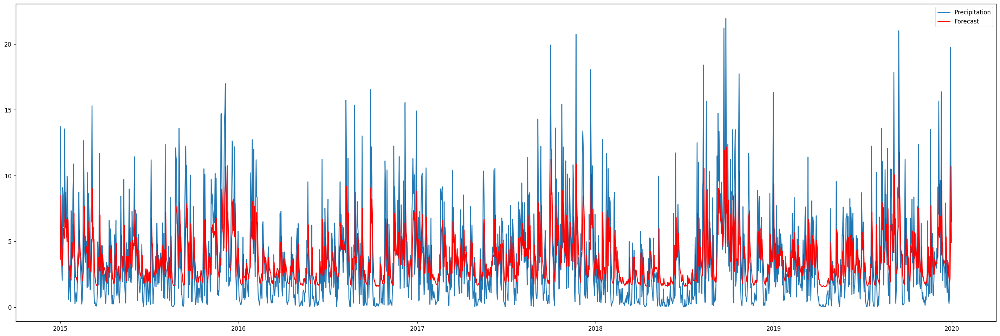

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_norway = sm.tsa.SARIMAX(data_norway['precipitation'], order=(1, 0, 2, 12), trend='c')
# Estimate the parameters
results_norway = model_norway.fit()

ax = plt.gca()
plt.plot(data_norway['precipitation'])
plt.plot(results_norway.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_norway.summary()) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Statespace Model Results                           
Dep. Variable:          precipitation   No. Observations:                 1826
Model:               SARIMAX(1, 0, 3)   Log Likelihood               -4640.840
Date:                Mon, 08 Aug 2022   AIC                           9293.680
Time:                        14:36:59   BIC                           9326.739
Sample:                    01-01-2015   HQIC                          9305.875
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1856      0.068      2.741      0.006       0.053       0.318
ar.L1          0.9493      0.018     53.626      0.000       0.915       0.984
ma.L1         -0.5220      0.030    -17.471      0.0

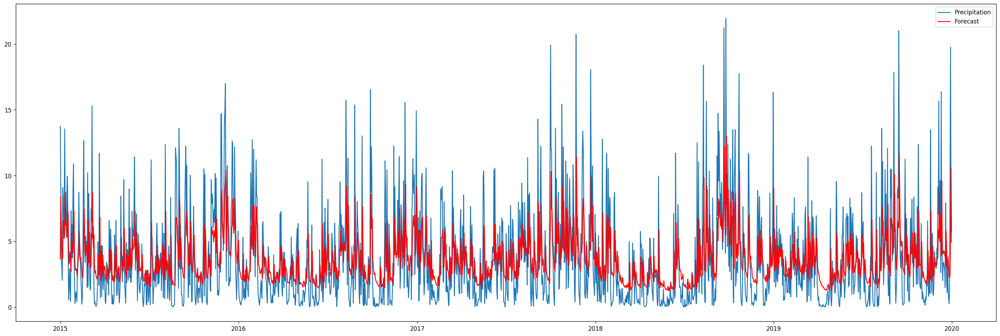

In [ ]:
fig = plt.figure(figsize=(30,10))

# Construct the model
model_norway = sm.tsa.SARIMAX(data_norway['precipitation'], order=(1, 0, 3, 12), trend='c')
# Estimate the parameters
results_norway = model_norway.fit()

ax = plt.gca()
plt.plot(data_norway['precipitation'])
plt.plot(results_norway.fittedvalues, color='red')
ax.legend(['Precipitation', 'Forecast'])

print(results_norway.summary()) 

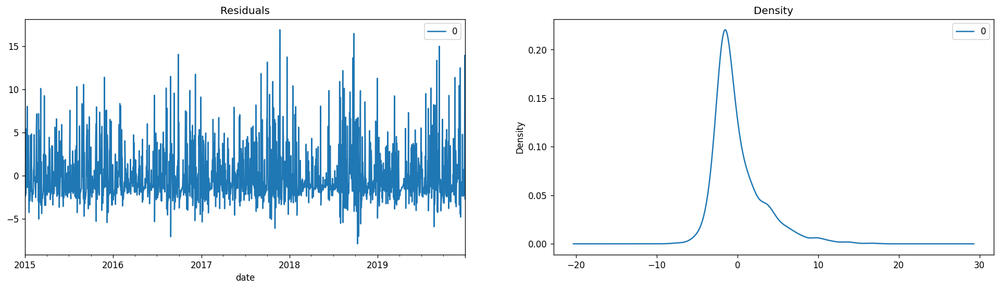

In [ ]:
plt.rcParams.update({'figure.figsize':(20,5), 'figure.dpi':120})

# Plot residual errors
residuals = pd.DataFrame(results_norway.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = "Density", ax = ax[1])
plt.show()

### **Forecasting (SARIMAX)**

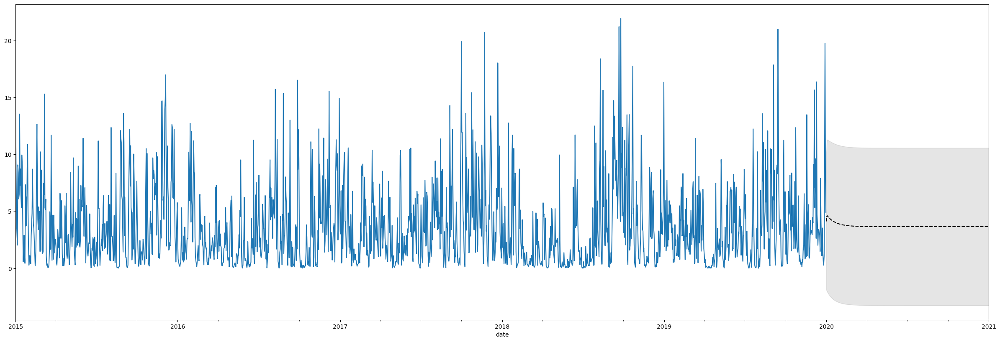

In [ ]:
fig, ax = plt.subplots(figsize = (30,10), dpi = 100)

# Plot the data (here we are subsetting it to get a better look at the forecasts)
data_norway['precipitation'].loc['2015':].plot(ax=ax)

# Construct the forecasts
fcast = results_norway.get_forecast('2021').summary_frame()
fcast['mean'].plot(ax=ax, style='k--')
ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='k', alpha=0.1);